<h1>Loading important libraries</h1>


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from ydata_profiling import ProfileReport

from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score
import joblib

%matplotlib inline

<h2>Data exploration </h2>

In [2]:
df = pd.read_csv('weatherAUS.csv')

# Removing unnecessary columns and rows 
df.drop(['RISK_MM','Date', 'Location', 'Cloud9am', 'Cloud3pm'], axis=1, inplace=True)
df.dropna(subset=['RainTomorrow'], inplace=True)

In [3]:
df.shape
df.info()
df.describe(include='all')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 142193 entries, 0 to 145458
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   MinTemp        141556 non-null  float64
 1   MaxTemp        141871 non-null  float64
 2   Rainfall       140787 non-null  float64
 3   Evaporation    81350 non-null   float64
 4   Sunshine       74377 non-null   float64
 5   WindGustDir    132863 non-null  object 
 6   WindGustSpeed  132923 non-null  float64
 7   WindDir9am     132180 non-null  object 
 8   WindDir3pm     138415 non-null  object 
 9   WindSpeed9am   140845 non-null  float64
 10  WindSpeed3pm   139563 non-null  float64
 11  Humidity9am    140419 non-null  float64
 12  Humidity3pm    138583 non-null  float64
 13  Pressure9am    128179 non-null  float64
 14  Pressure3pm    128212 non-null  float64
 15  Temp9am        141289 non-null  float64
 16  Temp3pm        139467 non-null  float64
 17  RainToday      140787 non-nul

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,141556.000000,141871.000000,140787.000000,81350.000000,74377.000000,132863,132923.000000,132180,138415,140845.000000,139563.000000,140419.000000,138583.000000,128179.000000,128212.000000,141289.000000,139467.000000,140787,142193
unique,NaN,NaN,NaN,NaN,NaN,16,NaN,16,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2
top,NaN,NaN,NaN,NaN,NaN,W,NaN,N,SE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,No
freq,NaN,NaN,NaN,NaN,NaN,9780,NaN,11393,10663,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,109332,110316
mean,12.186400,23.226784,2.349974,5.469824,7.624853,NaN,39.984292,NaN,NaN,14.001988,18.637576,68.843810,51.482606,1017.653758,1015.258204,16.987509,21.687235,NaN,NaN
std,6.403283,7.117618,8.465173,4.188537,3.781525,NaN,13.588801,NaN,NaN,8.893337,8.803345,19.051293,20.797772,7.105476,7.036677,6.492838,6.937594,NaN,NaN
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,NaN,6.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,-7.200000,-5.400000,NaN,NaN
25%,7.600000,17.900000,0.000000,2.600000,4.900000,NaN,31.000000,NaN,NaN,7.000000,13.000000,57.000000,37.000000,1012.900000,1010.400000,12.300000,16.600000,NaN,NaN
50%,12.000000,22.600000,0.000000,4.800000,8.500000,NaN,39.000000,NaN,NaN,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,16.700000,21.100000,NaN,NaN
75%,16.800000,28.200000,0.800000,7.400000,10.600000,NaN,48.000000,NaN,NaN,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,21.600000,26.400000,NaN,NaN


<AxesSubplot:xlabel='RainToday', ylabel='count'>

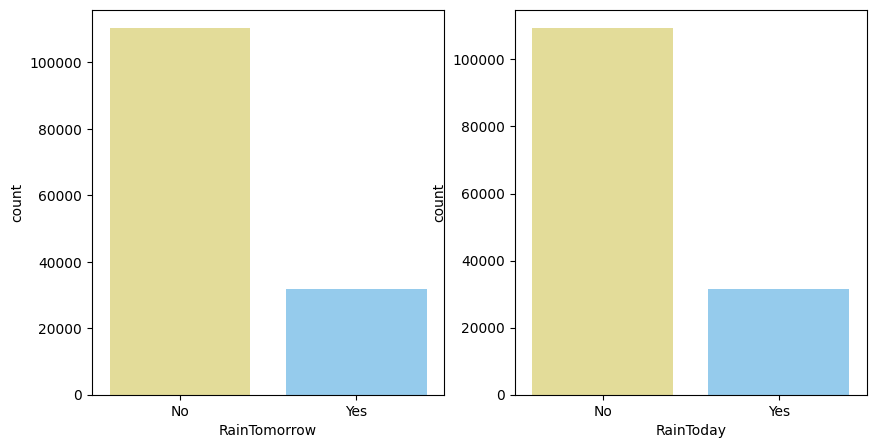

In [4]:
fig,ax = plt.subplots(1,2, figsize = (10,5))

sns.countplot(data = df,x='RainTomorrow',ax=ax[0], palette=['khaki', 'lightskyblue'])
sns.countplot(data = df,x='RainToday',ax=ax[1], palette=['khaki', 'lightskyblue'])

In [5]:
# Train-test splitting with StratifiedShuffleSplit (due to imbalanced data)
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=1)
for train_index, test_index in split.split(df,df['RainTomorrow']):
    train_set = df.iloc[train_index]
    test_set = df.iloc[test_index]

# Deviding data into attributes and label
X_train = train_set.drop('RainTomorrow', axis=1)
y_train = train_set['RainTomorrow']

X_test = test_set.drop('RainTomorrow', axis=1)
y_test = test_set['RainTomorrow']

# Defining numerical and categorical attributes 
num_attr = ['Evaporation', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm', 'MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm']
cat_attr = ['WindGustDir', 'WindDir9am', 'WindDir3pm', 'WindDir3pm', 'RainToday', 'Sunshine']

In [6]:
profiling = ProfileReport(train_set, title = "Weather")
profiling.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<h2>Preprocessing</h2>

In [7]:
# Class for handling NaN values
class PreProcessing(): 
     def fit_transform (self, X, y=None): 
        self = X.copy()
        for col in num_attr:
            self[col] = SimpleImputer(strategy='median').fit_transform(self[[col]])
        
        for col in cat_attr:
            self[col] = SimpleImputer(strategy='most_frequent').fit_transform(self[[col]])
        
        return self 

<h2>Building a model</h2>

In [8]:
# Fixing NaN values in train and test set
prep = PreProcessing()
X_train_prep = prep.fit_transform(X_train)
X_test_prep = prep.fit_transform(X_test)

In [9]:
# Scaling numeric attributes 
numeric_pipeline = Pipeline([('Scaler', StandardScaler())]) 
# Encoding categorical attributes
categorical_pipeline = Pipeline([('OneHot', OneHotEncoder(handle_unknown='ignore'))])
# Combining both pipelines 
transformer = ColumnTransformer([
    ('num', numeric_pipeline, num_attr), 
    ('cat', categorical_pipeline, cat_attr)])

mlpipe = Pipeline([('Transformer',transformer), ('rfc', RandomForestClassifier(random_state=1))])

In [10]:
mlpipe.fit(X_train_prep,y_train)

Pipeline(steps=[('Transformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('Scaler',
                                                                   StandardScaler())]),
                                                  ['Evaporation', 'Humidity9am',
                                                   'Humidity3pm', 'Pressure9am',
                                                   'Pressure3pm', 'Temp9am',
                                                   'Temp3pm', 'MinTemp',
                                                   'MaxTemp', 'Rainfall',
                                                   'WindGustSpeed',
                                                   'WindSpeed9am',
                                                   'WindSpeed3pm']),
                                                 ('cat',
                                                  Pipeline(steps=[('OneHot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['WindGustDir', 'WindDir9am',
                                                   'WindDir3pm', 'WindDir3pm',
                                                   'RainToday',
                                                   'Sunshine'])])),
                ('rfc', RandomForestClassifier(random_state=1))])

In [11]:
yhat = mlpipe.predict(X_test_prep)
accuracy_score(y_test, yhat)

0.8501002144941805

In [12]:
joblib.dump(mlpipe, 'rfc.joblib')

['rfc.joblib']